## Credit Card Approval Prediction:

### Objetivo

Predecir si el cliente aceptará una tarjeta de crédito (variable “y”).


In [72]:
import configparser
import joblib
import multiprocessing
import sys
sys.path.append("..")

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from ydata_profiling import ProfileReport

from preprocessing import PreprocessingDataset
from selection_model_classifier import ModelComparison

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedKFold
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, accuracy_score, f1_score, roc_auc_score, roc_curve

In [2]:
config = configparser.ConfigParser()
config.read('config.cfg')

['config.cfg']

### Datos

In [3]:
data = pd.read_csv(config['input']['path_input'] +'train.csv')

In [4]:
data.head()

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,mora,Vivienda,Consumo,Contacto,Mes,...,Campana,Dias_Ultima_Camp,No_Contactos,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
0,1,57,servicios,casado,bachillerato,unknown,no,no,telefono fijo,may,...,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
1,2,37,servicios,casado,bachillerato,no,si,no,telefono fijo,may,...,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
2,3,40,administrador negocio,casado,primaria,no,no,no,telefono fijo,may,...,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
3,4,56,servicios,casado,bachillerato,no,no,si,telefono fijo,may,...,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
4,7,25,servicios,single,bachillerato,no,si,no,telefono fijo,may,...,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0


## Validacion de calidad de datos

In [5]:
profile = ProfileReport(data, title="Data profiles")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
data.set_index('ID', inplace=True)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23099 entries, 1 to 32967
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Edad                23099 non-null  int64  
 1   Tipo_Trabajo        23099 non-null  object 
 2   Estado_Civil        23099 non-null  object 
 3   Educacion           23099 non-null  object 
 4   mora                23099 non-null  object 
 5   Vivienda            23099 non-null  object 
 6   Consumo             23099 non-null  object 
 7   Contacto            23099 non-null  object 
 8   Mes                 23099 non-null  object 
 9   Dia                 23099 non-null  object 
 10  Campana             23099 non-null  int64  
 11  Dias_Ultima_Camp    23099 non-null  int64  
 12  No_Contactos        23099 non-null  int64  
 13  Resultado_Anterior  23099 non-null  object 
 14  emp_var_rate        23099 non-null  float64
 15  cons_price_idx      23099 non-null  float64
 16  cons

In [8]:
data.describe()

,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
count,23099.000000,23099.000000,23099.000000,23099.000000,23099.000000,23099.000000,23099.000000,23099.000000,23099.000000,23099.000000
mean,40.067665,2.560154,962.976060,0.171003,0.095649,85576.471847,-40.485237,3190.939789,5167.329439,0.112126
std,10.449983,2.756954,185.675409,0.494079,1.565650,26224.436234,4.629643,2088.703058,72.260805,0.315528
min,18.000000,1.000000,0.000000,0.000000,-3.400000,93.200000,-50.800000,0.634000,4963.600000,0.000000
25%,32.000000,1.000000,999.000000,0.000000,-1.800000,92893.000000,-42.700000,1281.000000,5099.100000,0.000000
50%,38.000000,2.000000,999.000000,0.000000,1.100000,93876.000000,-41.800000,4856.000000,5191.000000,0.000000
75%,47.000000,3.000000,999.000000,0.000000,1.400000,93994.000000,-36.400000,4961.000000,5228.100000,0.000000
max,95.000000,42.000000,999.000000,6.000000,1.400000,94767.000000,-26.900000,5045.000000,5228.100000,1.000000


In [9]:
data.describe(include='O')

,Tipo_Trabajo,Estado_Civil,Educacion,mora,Vivienda,Consumo,Contacto,Mes,Dia,Resultado_Anterior
count,23099,23099,23099,23099,23099,23099,23099,23099,23099,23099
unique,12,6,8,3,3,3,2,10,5,3
top,administrador negocio,casado,pregrado,no,si,no,celular,may,thu,sin contacto
freq,5820,13965,6756,18331,12136,19062,14611,7758,4780,19992


In [10]:
data.isnull().sum()/len(data)

Edad                  0.0
Tipo_Trabajo          0.0
Estado_Civil          0.0
Educacion             0.0
mora                  0.0
Vivienda              0.0
Consumo               0.0
Contacto              0.0
Mes                   0.0
Dia                   0.0
Campana               0.0
Dias_Ultima_Camp      0.0
No_Contactos          0.0
Resultado_Anterior    0.0
emp_var_rate          0.0
cons_price_idx        0.0
cons_conf_idx         0.0
euribor3m             0.0
nr_employed           0.0
y                     0.0
dtype: float64

In [11]:
cat_cols = data.select_dtypes(
    include=["object", "category"]
).columns.to_list()

for col in cat_cols:
    print(col)
    print(len(data[data[col]=='unknown'])/len(data))

Tipo_Trabajo
0.007143166370838564
Estado_Civil
0.0016883847785618424
Educacion
0.041473656868262695
mora
0.20632927832373696
Vivienda
0.023940430321658945
Consumo
0.023940430321658945
Contacto
0.0
Mes
0.0
Dia
0.0
Resultado_Anterior
0.0


In [12]:
data.drop('mora', axis=1, inplace=True)

In [13]:
cat_cols = data.select_dtypes(
    include=["object", "category"]
).columns.to_list()

for col in cat_cols:
    data = data[data[col] !='unknown']

In [14]:
data.describe(include='O')

,Tipo_Trabajo,Estado_Civil,Educacion,Vivienda,Consumo,Contacto,Mes,Dia,Resultado_Anterior
count,21478,21478,21478,21478,21478,21478,21478,21478,21478
unique,11,5,7,2,2,2,10,5,3
top,administrador negocio,casado,pregrado,si,no,celular,may,thu,sin contacto
freq,5558,13007,6569,11588,18144,13654,7233,4450,18620


In [15]:
data.drop(['Dias_Ultima_Camp', 'No_Contactos'], axis=1, inplace=True)

In [16]:
data.head()

,Edad,Tipo_Trabajo,Estado_Civil,Educacion,Vivienda,Consumo,Contacto,Mes,Dia,Campana,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
ID,,,,,,,,,,,,,,,,,
1,57,servicios,casado,bachillerato,no,no,telefono fijo,may,mon,1,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
2,37,servicios,casado,bachillerato,si,no,telefono fijo,may,mon,1,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
3,40,administrador negocio,casado,primaria,no,no,telefono fijo,may,mon,1,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
4,56,servicios,casado,bachillerato,no,si,telefono fijo,may,mon,1,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0
7,25,servicios,single,bachillerato,si,no,telefono fijo,may,mon,1,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0,0


## Interacciones de las covariables con la variable de respuesta 'y'

array([[<Axes: title={'center': 'Edad'}>,
        <Axes: title={'center': 'Campana'}>,
        <Axes: title={'center': 'emp_var_rate'}>],
       [<Axes: title={'center': 'cons_price_idx'}>,
        <Axes: title={'center': 'cons_conf_idx'}>,
        <Axes: title={'center': 'euribor3m'}>],
       [<Axes: title={'center': 'nr_employed'}>,
        <Axes: title={'center': 'y'}>, <Axes: >]], dtype=object)

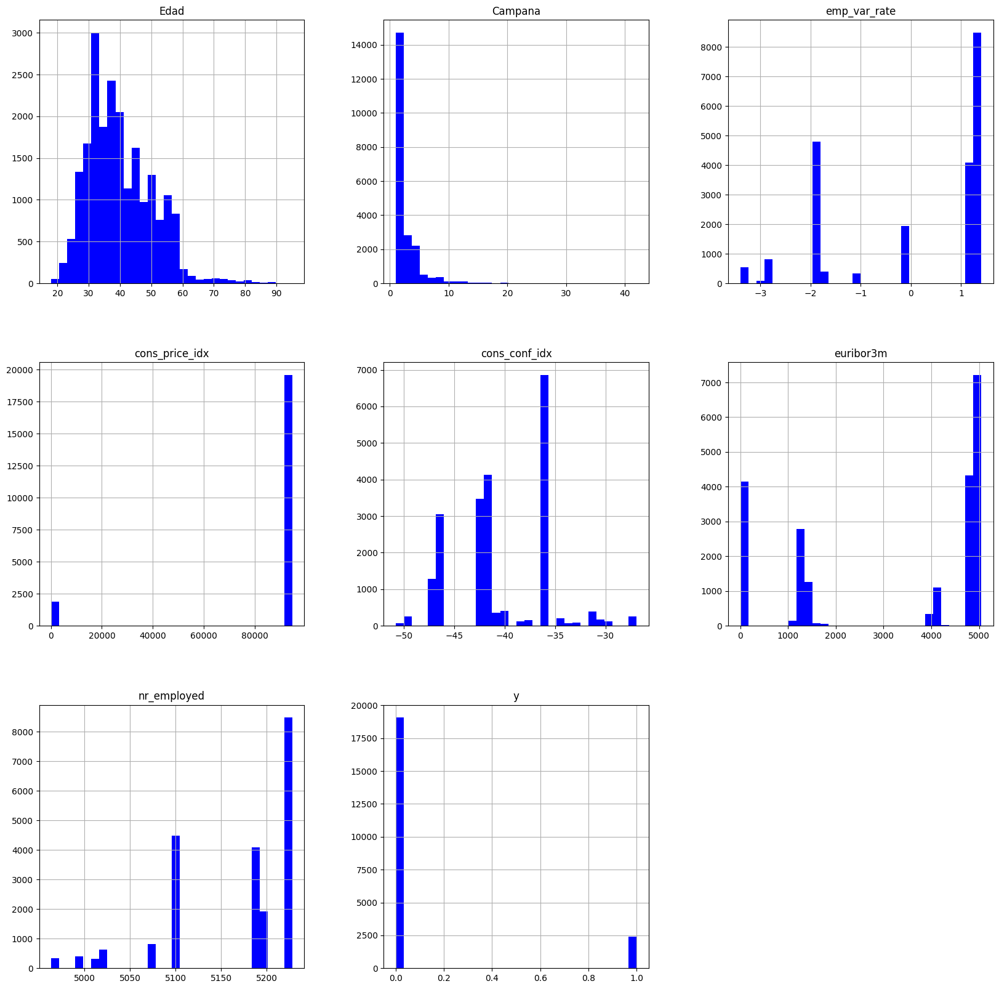

In [17]:
data.hist(bins = 30, figsize=(20,20), color = 'b')

In [18]:
no_tc = len(data[data['y']==0])
si_tc = len(data[data['y']==1])
print("Total de clientes a estudiar = ", len(data))

print("Número de clientes que no toman la TC = ", no_tc)
print("Porcentaje de clientes que no toman la TC  = ", 1.*no_tc/len(data)*100.0, "%")

print("Número de clientes que si toman la TC  = ", si_tc)
print("Porcentaje de clientes que si toman la TC  = ", 1.*si_tc/len(data)*100.0, "%")

Total de clientes a estudiar =  21478
Número de clientes que no toman la TC =  19084
Porcentaje de clientes que no toman la TC  =  88.85371077381507 %
Número de clientes que si toman la TC  =  2394
Porcentaje de clientes que si toman la TC  =  11.146289226184933 %


<Axes: xlabel='Edad', ylabel='count'>

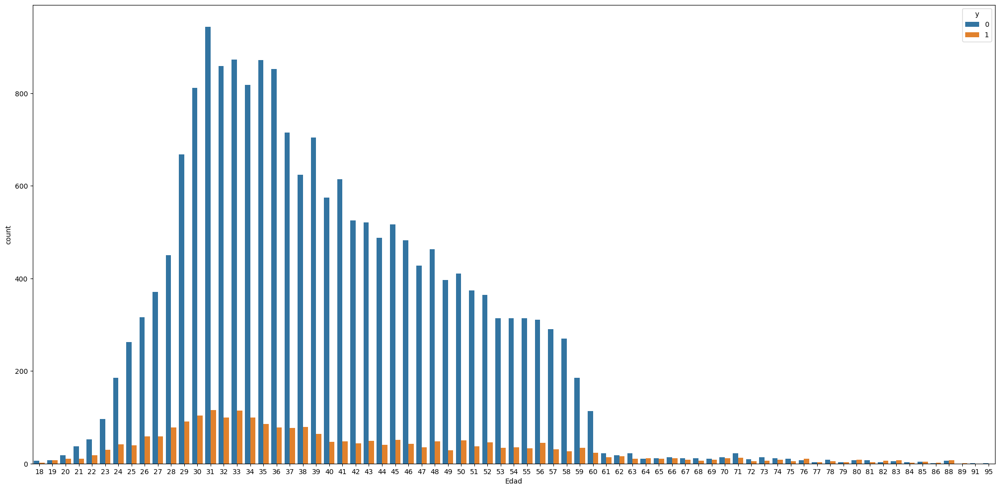

In [19]:
plt.figure(figsize=[25,12])
sns.countplot(x = 'Edad', hue = 'y', data = data)

Text(0, 0.5, 'Proporción de clientes')

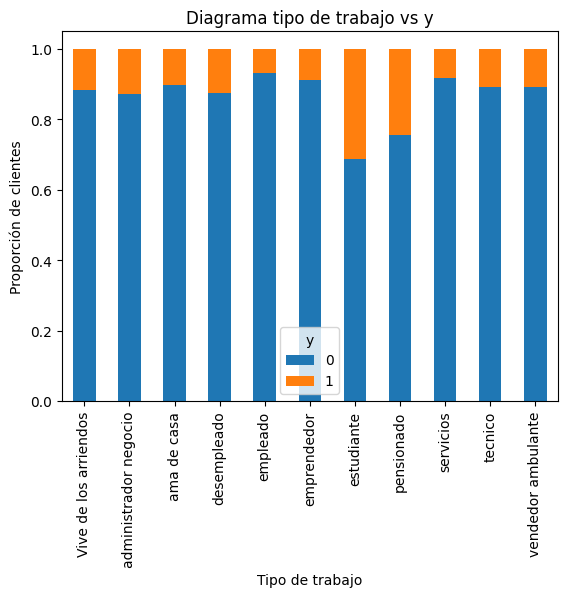

In [20]:
table = pd.crosstab(data.Tipo_Trabajo, data.y)
table.div(table.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True)
plt.title("Diagrama tipo de trabajo vs y")
plt.xlabel("Tipo de trabajo")
plt.ylabel("Proporción de clientes")

Text(0, 0.5, 'Proporción de clientes')

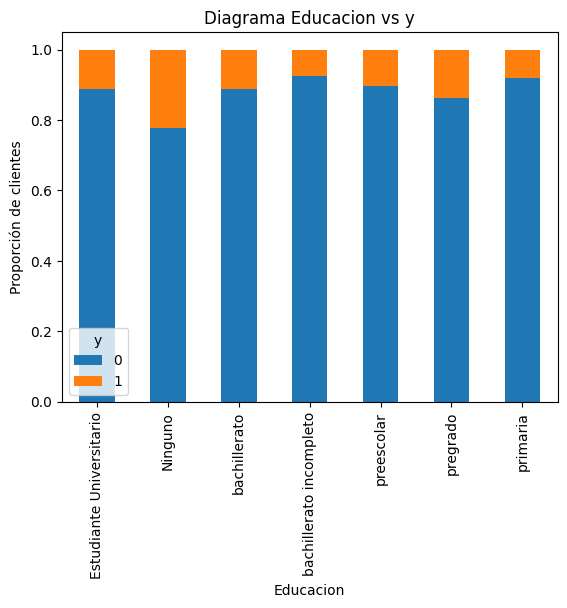

In [21]:
table = pd.crosstab(data.Educacion, data.y)
table.div(table.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True)
plt.title("Diagrama Educacion vs y")
plt.xlabel("Educacion")
plt.ylabel("Proporción de clientes")

Text(0, 0.5, 'Proporción de clientes')

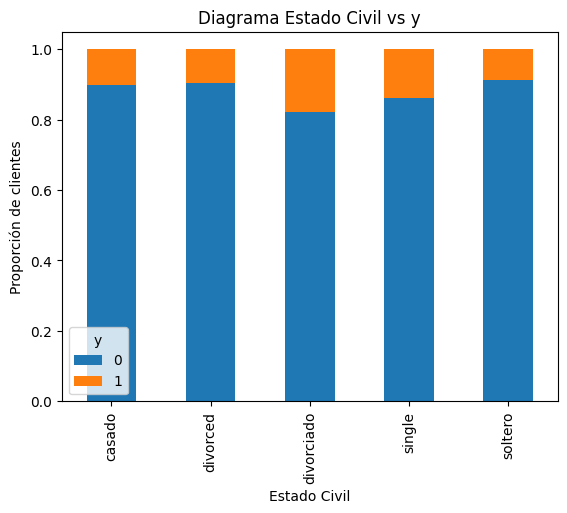

In [22]:
table = pd.crosstab(data.Estado_Civil, data.y)
table.div(table.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True)
plt.title("Diagrama Estado Civil vs y")
plt.xlabel("Estado Civil")
plt.ylabel("Proporción de clientes")

Text(0, 0.5, 'Proporción de clientes')

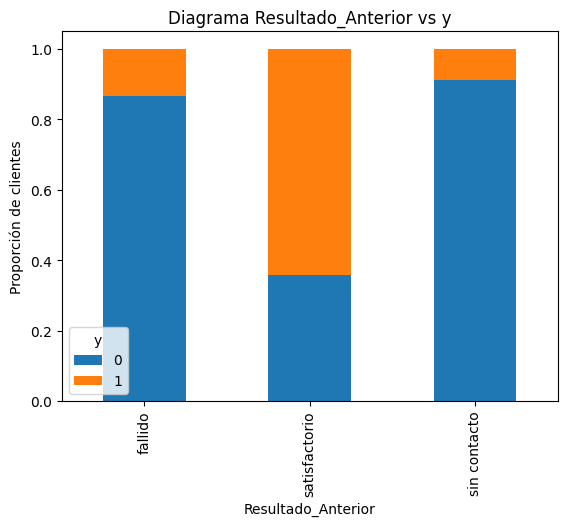

In [23]:
table = pd.crosstab(data.Resultado_Anterior, data.y)
table.div(table.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True)
plt.title("Diagrama Resultado_Anterior vs y")
plt.xlabel("Resultado_Anterior")
plt.ylabel("Proporción de clientes")

<Axes: xlabel='y', ylabel='nr_employed'>

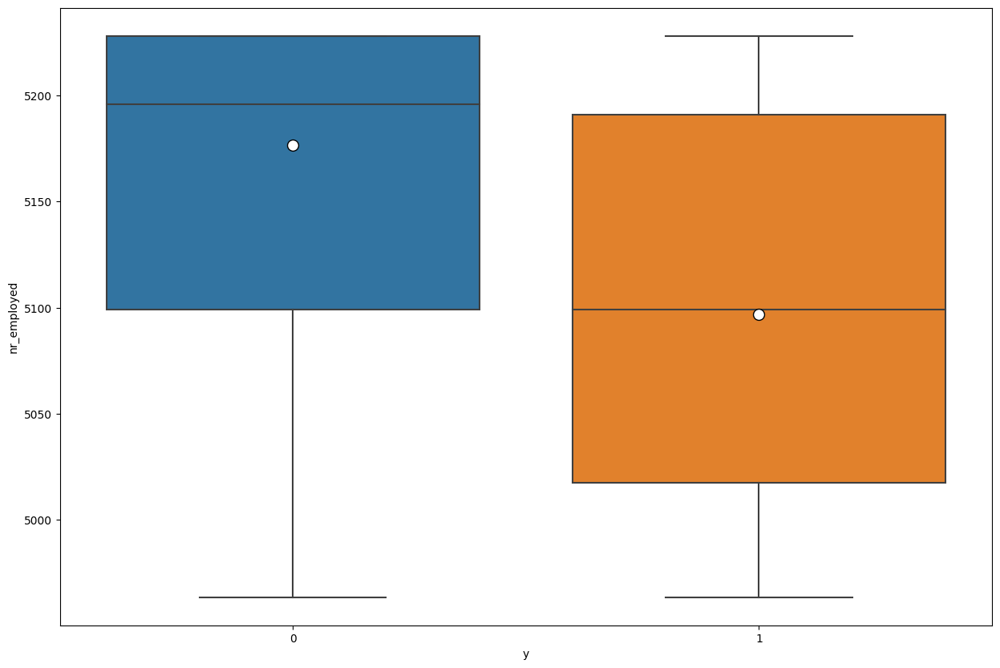

In [24]:
plt.figure(figsize=(15, 10))
sns.boxplot(x = 'y', y = 'nr_employed', data = data, showmeans=True, meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black","markersize":"10"})

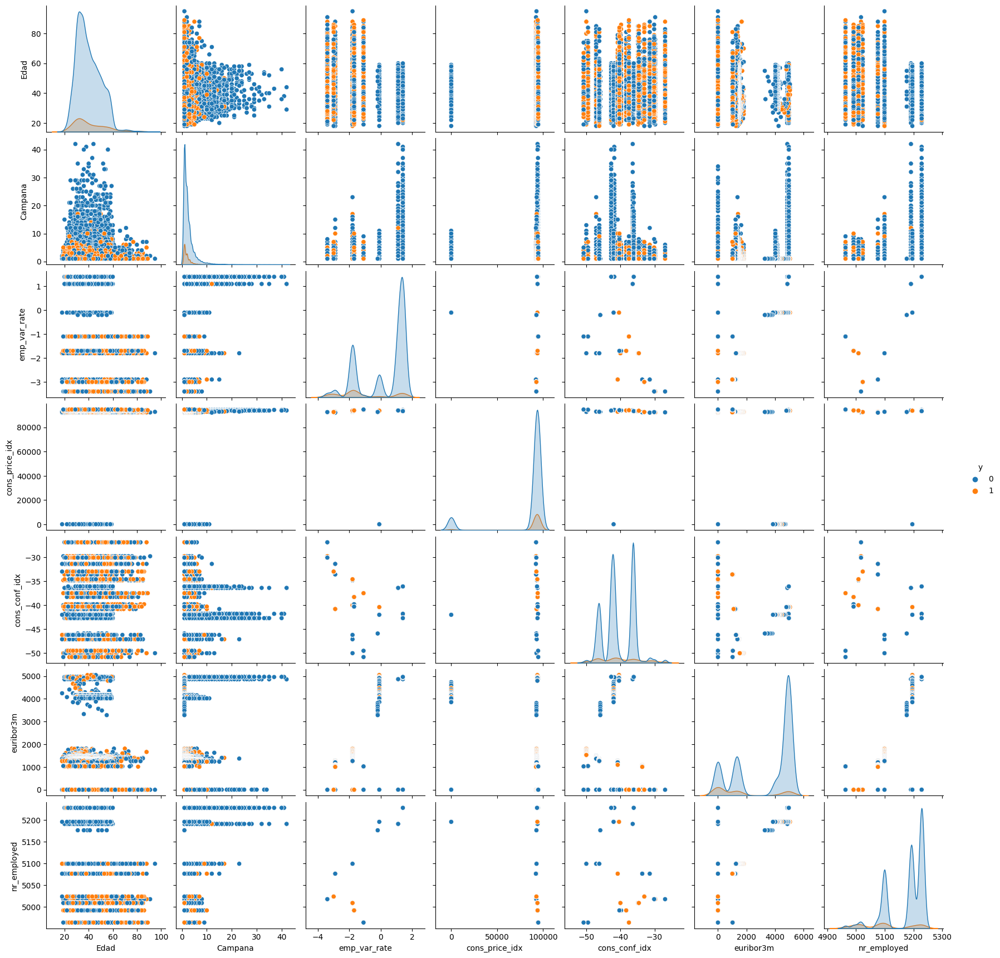

In [25]:
sns.pairplot(data, hue="y")

In [26]:
cor_matrix = data.select_dtypes(include=['float64', 'int64']).corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.75)]

In [27]:
to_drop

['euribor3m', 'nr_employed']

In [28]:
data.drop('nr_employed', axis=1, inplace=True)

## Seleccion de variables - Feature Importance

In [29]:
data_var = data.columns.values.tolist()
var_y = ['y']
var_X = [v for v in data_var if v not in var_y]
y = data[var_y]
X = data[var_X]

In [30]:
datos_train_prep = PreprocessingDataset(X, var_X).preprocessing_dataset()

In [31]:
rf = RandomForestClassifier(
         n_estimators=100,
         n_jobs=-1,
         min_samples_leaf = 1,
         oob_score=True,
         random_state = 42)
rf.fit(datos_train_prep, y)

print(f"RF train accuracy: {rf.score(datos_train_prep, y):.3f}")

RF train accuracy: 0.996


<Axes: >

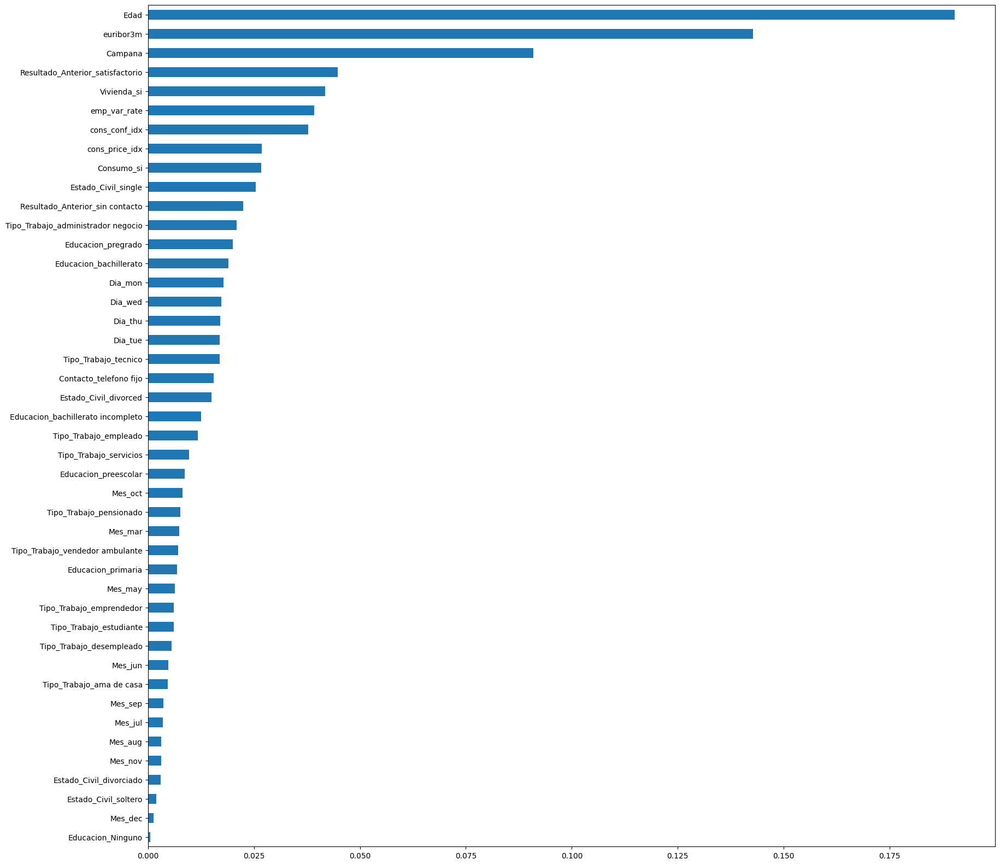

In [32]:
feat_importances = pd.Series(rf.feature_importances_, index = datos_train_prep.columns).sort_values(ascending = True)
feat_importances.plot(kind = 'barh', figsize=(20,20))

In [33]:
var_X_selected = ['Edad', 'euribor3m', 'Campana', 'Resultado_Anterior']
X_train = data[var_X_selected]
datos_train_prep = PreprocessingDataset(X_train, var_X_selected).preprocessing_dataset()

In [34]:
datos_train_prep

,Edad,euribor3m,Campana,Resultado_Anterior_satisfactorio,Resultado_Anterior_sin contacto
0,1.650583,0.797843,-0.564742,0.0,1.0
1,-0.283662,0.797843,-0.564742,0.0,1.0
2,0.006475,0.797843,-0.564742,0.0,1.0
3,1.553871,0.797843,-0.564742,0.0,1.0
4,-1.444209,0.797843,-0.564742,0.0,1.0
...,...,...,...,...,...
21473,-1.057360,-1.040945,-0.564742,1.0,0.0
21474,0.586749,-1.040945,-0.564742,0.0,1.0
21475,1.553871,-1.040945,-0.201876,0.0,1.0
21476,0.393324,-1.040945,-0.564742,0.0,1.0


## Particion de datos de entrenamiento y validacion

In [35]:
X_train, X_val, y_train, y_val = train_test_split(datos_train_prep, y, test_size = 0.20, random_state=123, stratify=y)
print(len(y_train))
print(len(y_val))

17182
4296


## Modelos de clasificacion datos de entrenamiento

In [36]:
rf = RandomForestClassifier(
         n_estimators=100,
         n_jobs=-1,
         min_samples_leaf = 1,
         oob_score=True,
         random_state = 42)
rf.fit(datos_train_prep, y)

print(f"RF train accuracy: {rf.score(X_train, y_train):.3f}")


RF train accuracy: 0.956


## Comparacion de modelos de clasificacion

LOG: 0.283850 (0.041626)
RF: 0.421110 (0.025204)
GB: 0.338197 (0.037569)
XGB: 0.322105 (0.033353)


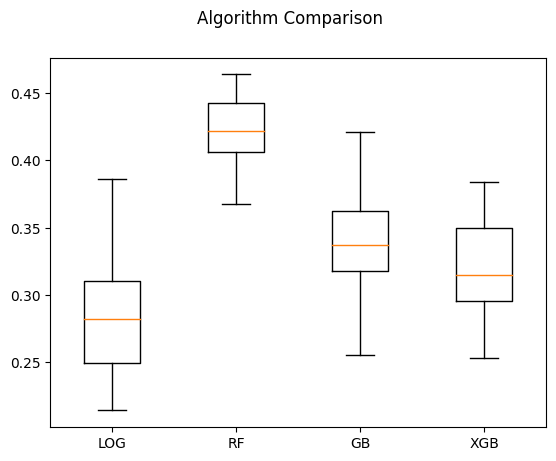

In [37]:
ModelComparison(X_train, y_train, 'f1').selection_model_classifier()

## Optimizacion de hiperparametros

In [60]:
# weigth_0 = len(data) / (2 * len(data[data['y']==0]))
# weigth_1 = len(data) / (2 * len(data[data['y']==1]))

weigth_0_0 = len(data[data['y']==0])/ len(data)
weigth_1_0 = len(data[data['y']==1])/ len(data)

param_grid_rf = {'n_estimators': [100,120,150],
              'max_features': [5, 10],
              'max_depth'   : [5,6],
              'criterion'   : ['gini', 'entropy']
             }

grid = GridSearchCV(
        estimator  = RandomForestClassifier(min_samples_leaf= 10, class_weight={0:weigth_0_0, 1:weigth_1_0},random_state = 123),
        param_grid = param_grid_rf,
        scoring    = ('f1'),
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=5, n_repeats=3, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

%time grid.fit(X = X_train, y = y_train)

/Users/lauraorozco/Desktop/credits/Prueba_Tecnica/.venv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/lauraorozco/Desktop/credits/Prueba_Tecnica/.venv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/lauraorozco/Desktop/credits/Prueba_Tecnica/.venv/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Use

CPU times: user 1.45 s, sys: 325 ms, total: 1.78 s
Wall time: 51.6 s


GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=123),
             estimator=RandomForestClassifier(class_weight={0: 0.8885371077381506,
                                                            1: 0.11146289226184933},
                                              min_samples_leaf=10,
                                              random_state=123),
             n_jobs=7,
             param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [5, 6],
                         'max_features': [5, 10],
                         'n_estimators': [100, 120, 150]},
             return_train_score=True, scoring='f1')

In [62]:
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv)")
print("----------------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'criterion': 'gini', 'max_depth': 6, 'max_features': 5, 'n_estimators': 120} : 0.03055689385078532 f1


## Balanceo de datos - Oversampling

In [40]:
sm = SMOTE(random_state = 2)
X_train_res, y_train_res = sm.fit_resample(datos_train_prep, y)
  
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res.y ==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res.y ==0)))

After OverSampling, the shape of train_X: (38168, 5)
After OverSampling, the shape of train_y: (38168, 1) 

After OverSampling, counts of label '1': 19084
After OverSampling, counts of label '0': 19084


LOG: 0.709678 (0.007806)
RF: 0.775382 (0.009854)
GB: 0.916907 (0.004667)
XGB: 0.918361 (0.004462)


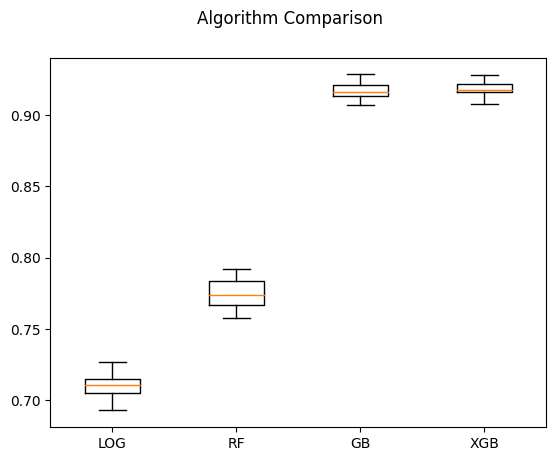

In [41]:
ModelComparison(X_train_res, y_train_res, 'f1').selection_model_classifier()

In [42]:
param_grid = {'n_estimators'  : [100, 250, 500],
              'max_depth'     : [3, 5, 9],
             }


grid = GridSearchCV(
        estimator  = XGBClassifier(random_state=123),
        param_grid = param_grid,
        scoring    = 'f1',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=3, n_repeats=2, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

%time grid.fit(X = X_train_res, y = y_train_res, )

CPU times: user 14.3 s, sys: 3.21 s, total: 17.5 s
Wall time: 28.5 s


GridSearchCV(cv=RepeatedKFold(n_repeats=2, n_splits=3, random_state=123),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=123, ...),
             n_jobs=7,
             param_grid={'max_depth': [3, 5, 9],
                         'n_estimators': [100, 250, 500]},
             return_train_score=True, scoring='f1')

In [43]:
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv)")
print("----------------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'max_depth': 9, 'n_estimators': 250} : 0.9227995056102785 f1


## Modelo final - XGBoost

In [44]:
modelo_final_xgb = grid.best_estimator_

## Evaluacion del modelo predictivo con datos de validacion

In [45]:
y_train_pred = modelo_final_xgb.predict(X_val)

<Figure size 1600x1600 with 0 Axes>

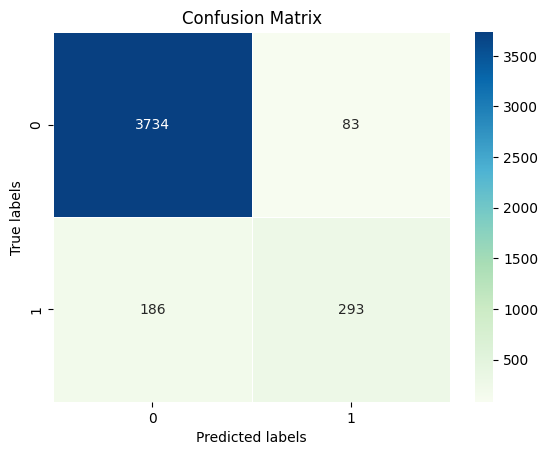

<Figure size 1600x1600 with 0 Axes>

In [46]:
cm = confusion_matrix( y_val, y_train_pred)
ax= plt.subplot()
sns.heatmap(cm, ax=ax, annot=True, cmap="GnBu", fmt='.5g', linewidths=.5);
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
plt.figure(figsize=(16, 16))

In [64]:
print('Precision: %.3f' % precision_score(y_val, y_train_pred))

Precision: 0.779


In [65]:
print('Recall: %.3f' % recall_score(y_val, y_train_pred))

Recall: 0.612


In [66]:
print('Accuracy: %.3f' % accuracy_score(y_val, y_train_pred))

Accuracy: 0.937


In [69]:
print('F1 Score: %.3f' % f1_score(y_val, y_train_pred))

F1 Score: 0.685


In [71]:
y_pred_proba = modelo_final_xgb.predict_proba(X_val)[::,1]
auc = roc_auc_score(y_val, y_pred_proba)
print(auc)

0.9309858708130805


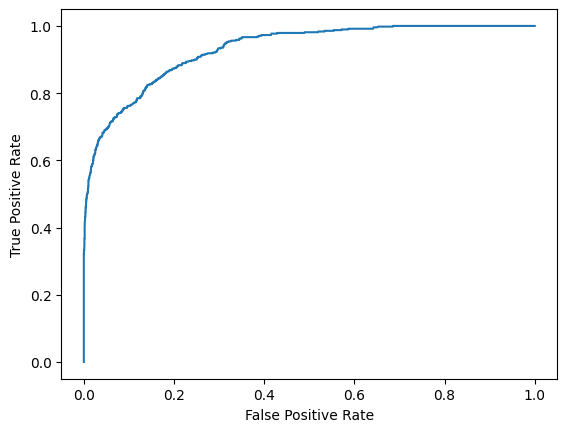

In [73]:
fpr, tpr, _ = roc_curve(y_val,  y_pred_proba)
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [47]:
print(classification_report(y_val, y_train_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      3817
           1       0.78      0.61      0.69       479

    accuracy                           0.94      4296
   macro avg       0.87      0.79      0.83      4296
weighted avg       0.93      0.94      0.93      4296



## Guardando modelo final para datos de  test

In [48]:
filename = 'xgb_model.sav'
joblib.dump(modelo_final_xgb, config['output']['path_output']+filename)

['/Users/lauraorozco/Desktop/credits/Prueba_Tecnica/data/salida/xgb_model.sav']

## Predicciones con datos nuevos

In [49]:
test = pd.read_csv(config['input']['path_input']+'test.csv')

In [50]:
test.head()

,ID,Edad,Tipo_Trabajo,Estado_Civil,Educacion,mora,Vivienda,Consumo,Contacto,Mes,Dia,Campana,Dias_Ultima_Camp,No_Contactos,Resultado_Anterior,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed
0,5,41,empleado,casado,unknown,unknown,no,no,telefono fijo,may,mon,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0
1,6,24,tecnico,single,Estudiante Universitario,no,si,no,telefono fijo,may,mon,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0
2,11,57,ama de casa,divorciado,preescolar,no,si,no,telefono fijo,may,mon,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0
3,13,54,pensionado,casado,bachillerato incompleto,unknown,si,si,telefono fijo,may,mon,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0
4,16,39,Vive de los arriendos,single,bachillerato incompleto,unknown,no,no,telefono fijo,may,mon,1,999,0,sin contacto,1.1,93994.0,-36.4,4857.0,5191.0


In [51]:
test.describe()

,ID,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed
count,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000
mean,16633.491589,39.959161,2.603668,962.070936,0.175111,0.059668,85539.462728,-40.567035,3146.756837,5166.527604
std,9505.916356,10.411015,2.866068,187.908001,0.493333,1.579210,26257.348429,4.606483,2091.240663,72.105792
min,5.000000,17.000000,1.000000,0.000000,0.000000,-3.400000,93.200000,-50.800000,0.634000,4963.600000
25%,8415.250000,32.000000,1.000000,999.000000,0.000000,-1.800000,92893.000000,-42.700000,1281.000000,5099.100000
50%,16761.500000,38.000000,2.000000,999.000000,0.000000,1.100000,93444.000000,-41.800000,4856.000000,5191.000000
75%,24915.250000,47.000000,3.000000,999.000000,0.000000,1.400000,93994.000000,-36.400000,4961.000000,5228.100000
max,32961.000000,98.000000,43.000000,999.000000,6.000000,1.400000,94767.000000,-26.900000,5045.000000,5228.100000


In [52]:
test.describe(include='O')

,Tipo_Trabajo,Estado_Civil,Educacion,mora,Vivienda,Consumo,Contacto,Mes,Dia,Resultado_Anterior
count,9868,9868,9868,9868,9868,9868,9868,9868,9868,9868
unique,12,6,8,2,3,3,2,10,5,3
top,administrador negocio,casado,pregrado,no,si,no,celular,may,thu,sin contacto
freq,2497,5955,2881,7810,5256,8111,6282,3304,2121,8489


In [53]:
test.set_index('ID', inplace=True)

In [54]:
test_selected = test[var_X_selected]

In [55]:
datos_test_prep = PreprocessingDataset(test_selected, var_X_selected).preprocessing_dataset()

In [56]:
y_pred_xgb = modelo_final_xgb.predict(datos_test_prep)
y_pred_xgb

array([1, 1, 1, ..., 1, 1, 1])

In [57]:
test['y_result'] = y_pred_xgb

In [58]:
test.describe()

,Edad,Campana,Dias_Ultima_Camp,No_Contactos,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y_result
count,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000,9868.000000
mean,39.959161,2.603668,962.070936,0.175111,0.059668,85539.462728,-40.567035,3146.756837,5166.527604,0.993616
std,10.411015,2.866068,187.908001,0.493333,1.579210,26257.348429,4.606483,2091.240663,72.105792,0.079650
min,17.000000,1.000000,0.000000,0.000000,-3.400000,93.200000,-50.800000,0.634000,4963.600000,0.000000
25%,32.000000,1.000000,999.000000,0.000000,-1.800000,92893.000000,-42.700000,1281.000000,5099.100000,1.000000
50%,38.000000,2.000000,999.000000,0.000000,1.100000,93444.000000,-41.800000,4856.000000,5191.000000,1.000000
75%,47.000000,3.000000,999.000000,0.000000,1.400000,93994.000000,-36.400000,4961.000000,5228.100000,1.000000
max,98.000000,43.000000,999.000000,6.000000,1.400000,94767.000000,-26.900000,5045.000000,5228.100000,1.000000


## Guardando los resultados de las predicciones de test

In [59]:
test.to_csv(config['output']['path_output']+'results_credit_cart.csv')